In [2]:
import scanpy as sc
import anndata as ad
import pandas as pd
import bbknn
import scanpy.external as sce
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
#008um
import squidpy as sq
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import anndata
from sklearn.neighbors import KNeighborsClassifier

In [12]:
sc_adata = sc.read_h5ad("flex_pelka_moorman_harmony_donor_integrated.h5ad")
#Bin2Cell 
p2_adata_bin2cell = sc.read_h5ad("/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/P2CRC/P2CRC_b2c_cells.h5ad")
p5_adata_bin2cell = sc.read_h5ad("/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/P5CRC/P5CRC_b2c_cells.h5ad")

#Visium HD
p2_008_adata = sq.read.visium(
    path="/gpfs/commons/groups/innovation/jjoseph/data/P2_CRC/binned_outputs/square_008um",
    counts_file="filtered_feature_bc_matrix.h5",
    load_images=True
)


p5_008_adata = sq.read.visium(
    path="/gpfs/commons/groups/innovation/jjoseph/data/P5_CRC/binned_outputs/square_008um",
    counts_file="filtered_feature_bc_matrix.h5",
    load_images=True
)


/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_un

In [3]:
print("Before filtering:")
print(f"Number of cells: {p2_adata_bin2cell.n_obs}")
print(f"Number of genes: {p2_adata_bin2cell.n_vars}")

# Apply filtering
sc.pp.filter_cells(p2_adata_bin2cell, min_counts=100)
sc.pp.filter_genes(p2_adata_bin2cell, min_counts=10)

# AFTER FILTERING
print("\nAfter filtering:")
print(f"Number of cells: {p2_adata_bin2cell.n_obs}")
print(f"Number of genes: {p2_adata_bin2cell.n_vars}")

Before filtering:
Number of cells: 240708
Number of genes: 18058

After filtering:
Number of cells: 236906
Number of genes: 18026


590650
AnnData object with n_obs × n_vars = 590650 × 611
    obs: 'biosample_id', 'donor_id', 'SpecimenType', 'TissueSource', 'ProcessingMethod', 'PatientTypeID', 'sex', 'Site', 'Grade', 'TumorStage', 'LymphNodeStatus', 'MMRStatusTumor', 'MMRMLH1Tumor', 'qc_geneCount', 'qc_logMappedReads', 'qc_meanReadsPerUmi', 'qc_totalReads', 'qc_logUmiCount', 'qc_bcSwapFraction', 'qc_geneSatFraction', 'qc_seqDupEst', 'qc_umiSatFraction', 'qc_emptyDropPval', 'qc_mitoFraction', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'total_counts', 'log1p_total_counts', 'Sample ID', 'PhenoGraph_clusters', 'Patient', 'Primary Site', 'Sample Type', 'Treatment', 'Cell Compartment', 'PhenoGraph Classification', 'Cell State', 'P(ISC)', 'P(Squamous)', 'P(Fetal)', 'P(Absorptive)', 'P(Proliferative)', 'P(Neuroendocrine)', 'P(Secretory)', 'organoid', 'condition', 'Module Osteobl

/nfs/home/jjoseph/.local/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


source
ref      590650
query    236906
Name: count, dtype: int64


2025-07-23 02:20:49,926 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-23 02:21:15,580 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-23 02:21:16,636 - harmonypy - INFO - Iteration 1 of 10
2025-07-23 02:23:48,016 - harmonypy - INFO - Iteration 2 of 10
2025-07-23 02:26:37,858 - harmonypy - INFO - Iteration 3 of 10
2025-07-23 02:29:34,990 - harmonypy - INFO - Iteration 4 of 10
2025-07-23 02:32:27,799 - harmonypy - INFO - Converged after 4 iterations


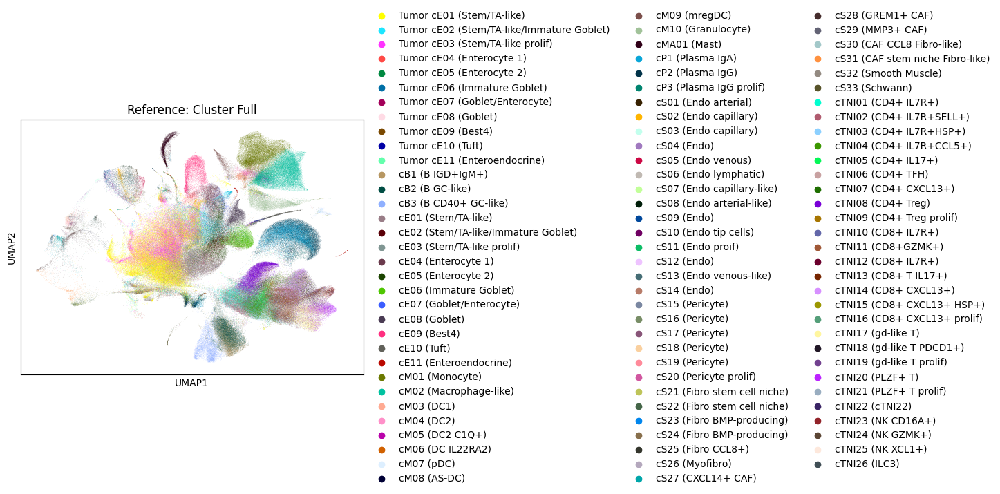

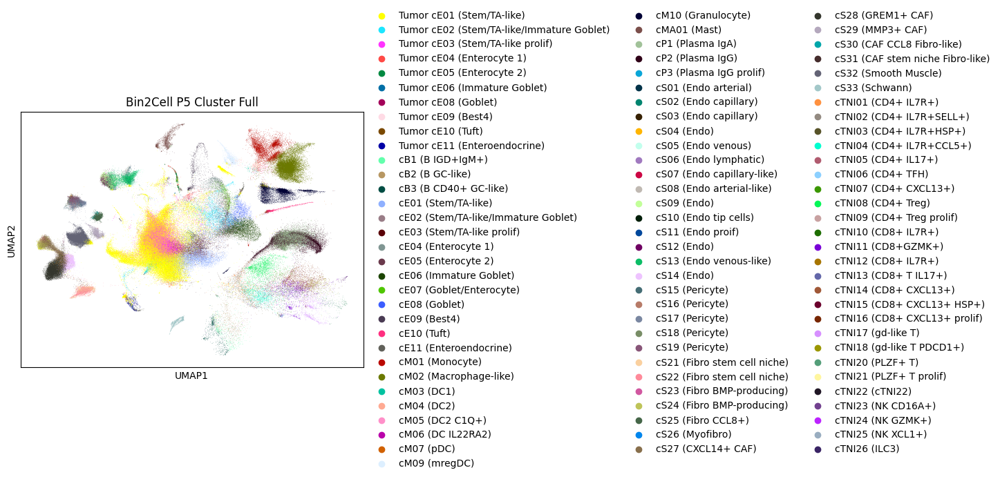

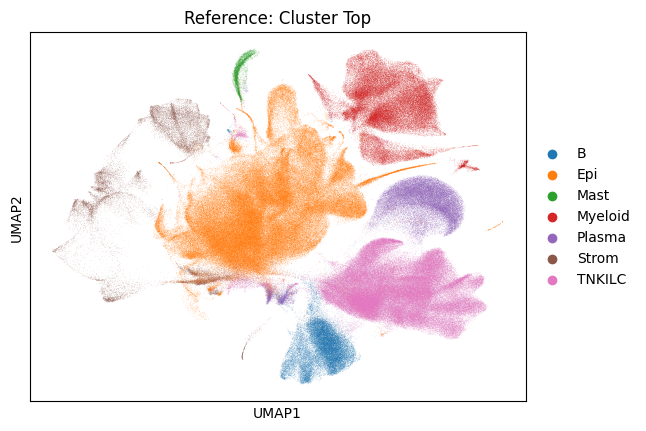

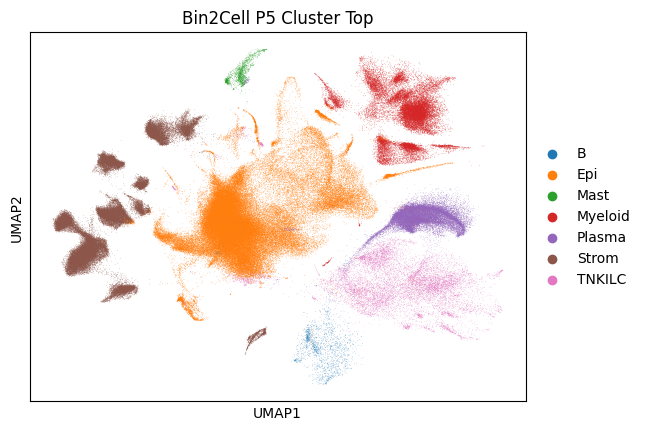

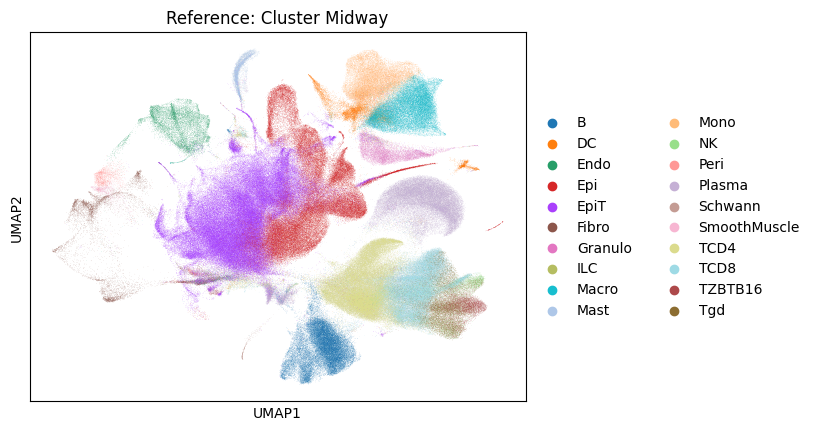

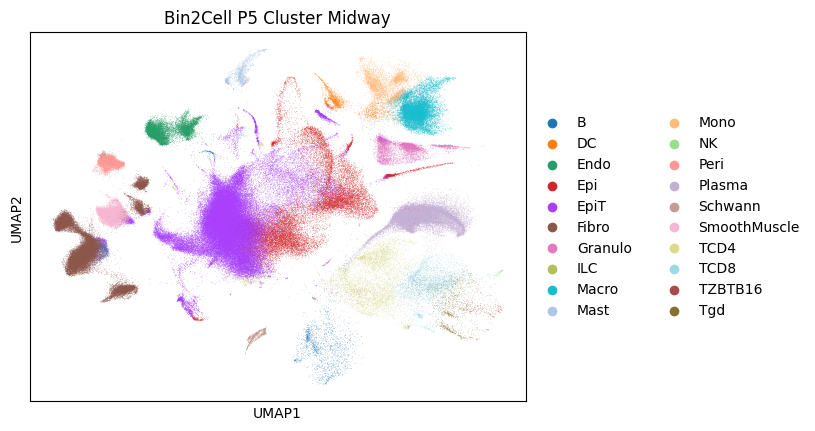

In [5]:

print(sc_adata.n_obs)

ref   = sc_adata.copy()
print(ref)
query = p2_adata_bin2cell.copy()

# Shared HVGs
if "highly_variable" in ref.var:
    hv_mask = ref.var["highly_variable"]
elif "highly_variable_rank" in ref.var:
    hv_mask = ~ref.var["highly_variable_rank"].isna()
else:
    hv_mask = np.ones(ref.n_vars, bool)

shared_hvg = ref.var_names[hv_mask].intersection(query.var_names)
ref = ref[:, shared_hvg].copy()
query = query[:, shared_hvg].copy()

# Normalize + scale query
sc.pp.normalize_total(query)
sc.pp.log1p(query)
sc.pp.scale(query)

# Combine datasets
combined = anndata.concat(
    [ref, query],
    label="source",
    keys=["ref", "query"],
    join="outer"
)

print(combined.obs["source"].value_counts())

# PCA + Harmony integration
sc.tl.pca(combined, n_comps=50, svd_solver="arpack")
sc.external.pp.harmony_integrate(combined, key="source")

# Neighbors + UMAP
sc.pp.neighbors(combined, use_rep="X_pca_harmony")
sc.tl.umap(combined)

# Masks
ref_mask = combined.obs["source"] == "ref"
query_mask = combined.obs["source"] == "query"

# Label transfer for multiple annotations
label_keys = ["ClusterFull", "ClusterTop", "ClusterMidway"]

for label in label_keys:
    if label not in combined.obs.columns:
        print(f"Label '{label}' not found in combined.obs — skipping.")
        continue

    knn = KNeighborsClassifier(n_neighbors=15)
    knn.fit(combined.obsm["X_pca_harmony"][ref_mask],
            combined.obs.loc[ref_mask, label])

    combined.obs.loc[query_mask, f"predicted_{label}"] = knn.predict(
        combined.obsm["X_pca_harmony"][query_mask]
    )

# Slice after all predictions are complete
ref_h = combined[ref_mask].copy()
query_h = combined[query_mask].copy()

# Plot
import os

# Make directory to store figures if it doesn't exist
os.makedirs("figures", exist_ok=True)

# Plot individual UMAPs for reference and query with saving and custom titles
for label in label_keys:
    # Plot for reference
    ref_title = f"Reference: {label.replace('Cluster', 'Cluster ')}"
    ref_fig = sc.pl.umap(
        ref_h,
        color=label,
        title=ref_title,
        show=False,
        return_fig=True
    )
    ref_fig.savefig(f"figures/umap_reference_{label}.png")
    ref_fig.show()

    # Plot for Bin2Cell
    pred_label = f"predicted_{label}"
    bin2cell_title = f"Bin2Cell P5 {label.replace('Cluster', 'Cluster ')}"
    query_fig = sc.pl.umap(
        query_h,
        color=pred_label,
        title=bin2cell_title,
        show=False,
        return_fig=True
    )
    query_fig.savefig(f"figures/umap_bin2cell_P5_{label}.png")
    query_fig.show()


In [ ]:
sc_adata.obs.columns

In [ ]:
sc_adata.obs

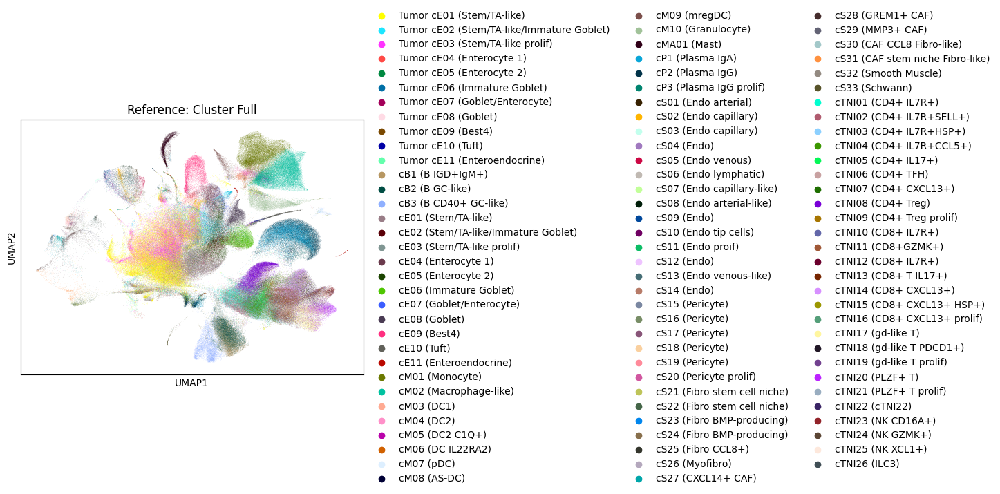

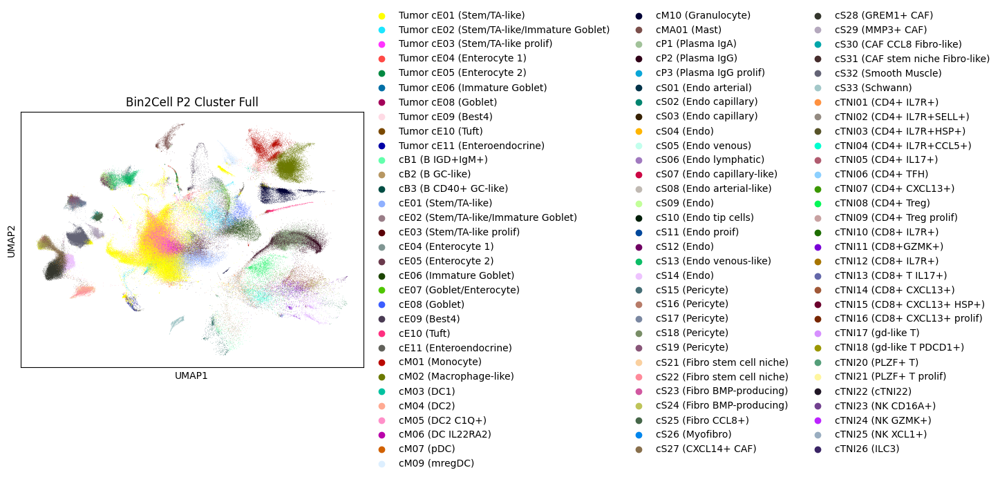

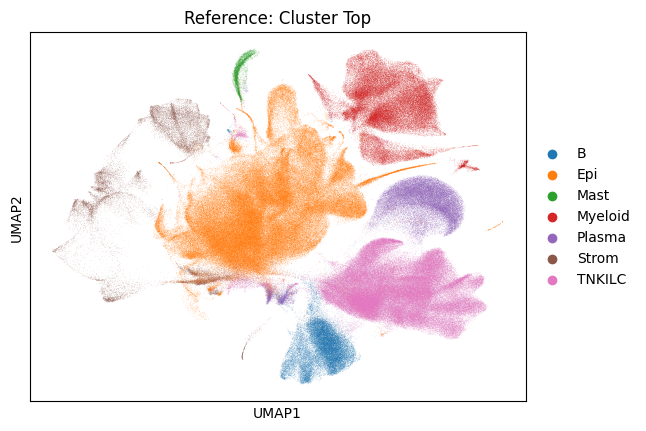

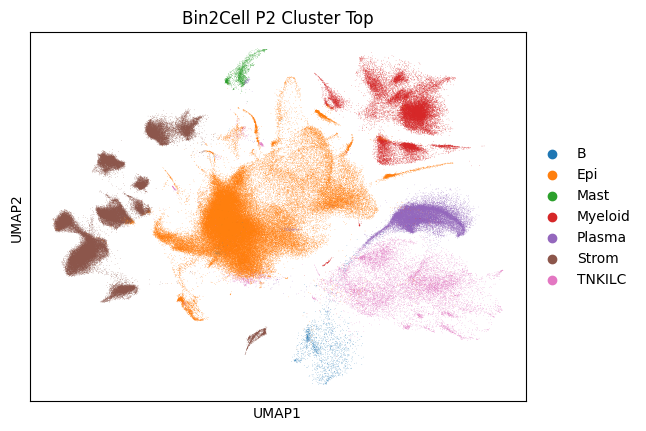

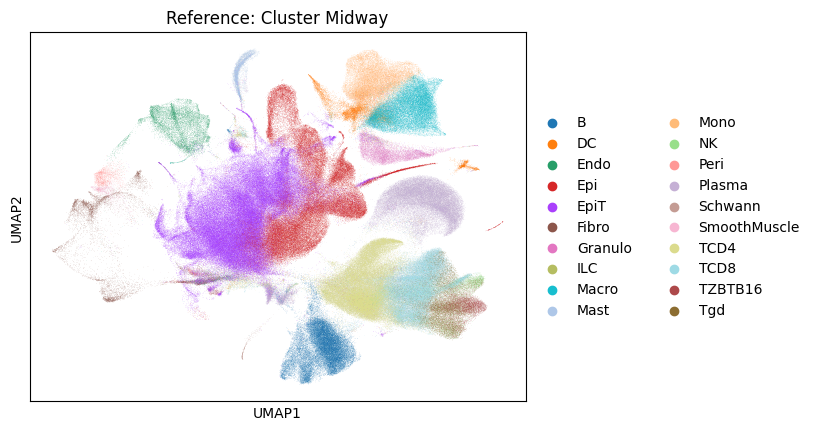

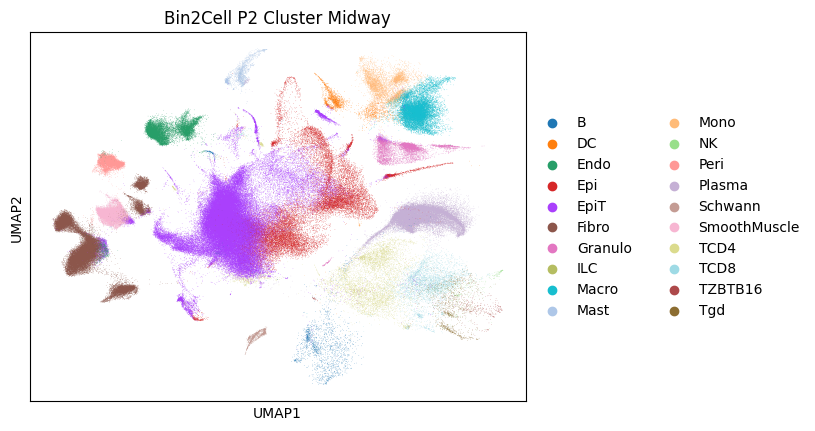

In [8]:
import os

# Assume `ref_h`, `query_h`, and `label_keys` still exist in memory

os.makedirs("figures", exist_ok=True)

for label in label_keys:
    if label not in ref_h.obs.columns or f"predicted_{label}" not in query_h.obs.columns:
        continue

    # Plot for reference
    ref_title = f"Reference: {label.replace('Cluster', 'Cluster ')}"
    ref_fig = sc.pl.umap(
        ref_h,
        color=label,
        title=ref_title,
        show=False,
        return_fig=True
    )
    ref_fig.savefig(f"figures/umap_reference_{label}.png")
    ref_fig.show()

    # Plot for Bin2Cell
    pred_label = f"predicted_{label}"
    bin2cell_title = f"Bin2Cell P2 {label.replace('Cluster', 'Cluster ')}"
    query_fig = sc.pl.umap(
        query_h,
        color=pred_label,
        title=bin2cell_title,
        show=False,
        return_fig=True
    )
    query_fig.savefig(f"figures/umap_bin2cell_P5_{label}.png")
    query_fig.show()


saving figure to file figures/umap_bin2cell_P2_ClusterTop.png


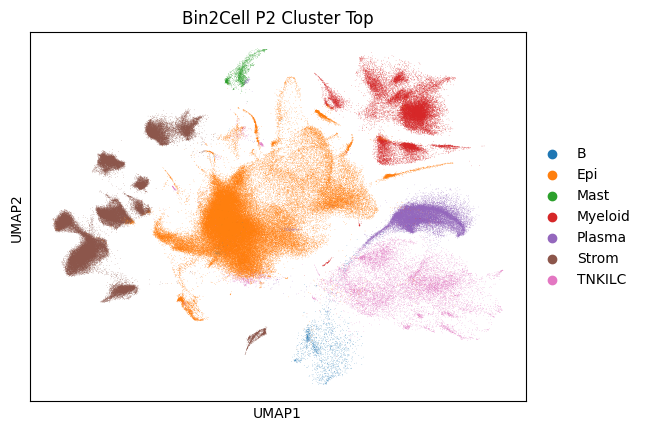

In [15]:
sc.pl.umap(
    query_h,
    color="predicted_ClusterTop",
    title="Bin2Cell P2 Cluster Top",
    size=0.5,  # adjust this: default is ~10–20 depending on backend
    save="_bin2cell_P2_ClusterTop.png"
)


In [39]:
def run_label_transfer_and_plot(ref_adata, query_adata, query_name):
    import os
    import numpy as np
    from sklearn.neighbors import KNeighborsClassifier

    ref = ref_adata.copy()
    query = query_adata.copy()
    ref.var_names_make_unique()
    query.var_names_make_unique()


    print(f"\n=== {query_name} ===")
    print("Before filtering:")
    print(f"Number of cells: {query.n_obs}")
    print(f"Number of genes: {query.n_vars}")

    # Filtering
    sc.pp.filter_cells(query, min_counts=100)
    sc.pp.filter_genes(query, min_counts=10)

    print("After filtering:")
    print(f"Number of cells: {query.n_obs}")
    print(f"Number of genes: {query.n_vars}")


    # Shared HVGs
    if "highly_variable" in ref.var:
        hv_mask = ref.var["highly_variable"]
    elif "highly_variable_rank" in ref.var:
        hv_mask = ~ref.var["highly_variable_rank"].isna()
    else:
        hv_mask = np.ones(ref.n_vars, bool)

    shared_hvg = ref.var_names[hv_mask].intersection(query.var_names)
    ref = ref[:, shared_hvg].copy()
    query = query[:, shared_hvg].copy()

    # Normalize + scale query
    sc.pp.normalize_total(query)
    sc.pp.log1p(query)
    sc.pp.scale(query)

    # Combine
    combined = anndata.concat(
        [ref, query],
        label="source",
        keys=["ref", "query"],
        join="outer"
    )

    print(f"{query_name}: Combined source counts\n", combined.obs["source"].value_counts())

    # PCA + Harmony
    sc.tl.pca(combined, n_comps=50, svd_solver="arpack")
    sc.external.pp.harmony_integrate(combined, key="source")

    # Neighbors + UMAP
    sc.pp.neighbors(combined, use_rep="X_pca_harmony")
    sc.tl.umap(combined)

    # Masks
    ref_mask = combined.obs["source"] == "ref"
    query_mask = combined.obs["source"] == "query"

    # Label transfer
    label_keys = ["ClusterFull", "ClusterTop", "ClusterMidway"]
    for label in label_keys:
        if label not in combined.obs.columns:
            print(f"Label '{label}' not found in combined.obs — skipping.")
            continue

        knn = KNeighborsClassifier(n_neighbors=15)
        knn.fit(combined.obsm["X_pca_harmony"][ref_mask],
                combined.obs.loc[ref_mask, label])

        combined.obs.loc[query_mask, f"predicted_{label}"] = knn.predict(
            combined.obsm["X_pca_harmony"][query_mask]
        )

    # Slice final datasets
    ref_h = combined[ref_mask].copy()
    query_h = combined[query_mask].copy()

    # Make output folder
    output_dir = f"figures_{query_name}"
    os.makedirs(output_dir, exist_ok=True)

    # Plot UMAPs
    for label in label_keys:
        if label not in ref_h.obs.columns or f"predicted_{label}" not in query_h.obs.columns:
            continue

        # Reference plot
        ref_title = f"Reference: {label.replace('Cluster', 'Cluster ')}"
        ref_fig = sc.pl.umap(
            ref_h,
            color=label,
            title=ref_title,
            show=False,
            return_fig=True
        )
        ref_fig.savefig(f"{output_dir}/umap_reference_{label}.png")
        ref_fig.show()

        # Query plot
        pred_label = f"predicted_{label}"
        query_title = f"Bin2Cell {query_name} {label.replace('Cluster', 'Cluster ')}"
        query_fig = sc.pl.umap(
            query_h,
            color=pred_label,
            title=query_title,
            show=False,
            return_fig=True
        )
        query_fig.savefig(f"{output_dir}/umap_bin2cell_{query_name}_{label}.png")
        query_fig.show()

    query_h.write_h5ad(f"{output_dir}/annotated_{query_name}.h5ad")
    print(f"[{query_name}] Saved labeled AnnData to: {output_dir}/annotated_{query_name}.h5ad")


In [ ]:
run_label_transfer_and_plot(sc_adata, p2_adata_bin2cell, "P2")
run_label_transfer_and_plot(sc_adata, p5_adata_bin2cell, "P5")



=== P2 ===
Before filtering:
Number of cells: 240708
Number of genes: 18058
After filtering:
Number of cells: 236906
Number of genes: 18026


/nfs/home/jjoseph/.local/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


P2: Combined source counts
 source
ref      590650
query    236906
Name: count, dtype: int64


2025-07-23 06:44:33,467 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-23 06:46:01,297 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-23 06:46:02,603 - harmonypy - INFO - Iteration 1 of 10
2025-07-23 06:48:41,868 - harmonypy - INFO - Iteration 2 of 10
2025-07-23 06:51:21,077 - harmonypy - INFO - Iteration 3 of 10
2025-07-23 06:54:00,345 - harmonypy - INFO - Iteration 4 of 10
2025-07-23 06:56:39,621 - harmonypy - INFO - Converged after 4 iterations


[P2] Saved labeled AnnData to: figures_P2/annotated_P2.h5ad

=== P5 ===
Before filtering:
Number of cells: 225579
Number of genes: 18049
After filtering:
Number of cells: 223122
Number of genes: 18033


/nfs/home/jjoseph/.local/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


P5: Combined source counts
 source
ref      590650
query    223122
Name: count, dtype: int64


2025-07-23 07:10:55,785 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-23 07:12:22,313 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-23 07:12:23,587 - harmonypy - INFO - Iteration 1 of 10


/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")



=== P2_008 ===
Before filtering:
Number of cells: 545913
Number of genes: 18085
After filtering:
Number of cells: 429224
Number of genes: 17994


/nfs/home/jjoseph/.local/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


P2_008: Combined source counts
 source
ref      590650
query    429224
Name: count, dtype: int64


2025-07-23 05:31:43,712 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-23 05:33:32,163 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-23 05:33:33,746 - harmonypy - INFO - Iteration 1 of 10
2025-07-23 05:36:50,283 - harmonypy - INFO - Iteration 2 of 10
2025-07-23 05:40:06,581 - harmonypy - INFO - Iteration 3 of 10
2025-07-23 05:42:46,071 - harmonypy - INFO - Iteration 4 of 10
2025-07-23 05:44:48,787 - harmonypy - INFO - Converged after 4 iterations


[P2_008] Saved labeled AnnData to: figures_P2_008/annotated_P2_008.h5ad


/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")



=== P5_008 ===
Before filtering:
Number of cells: 541968
Number of genes: 18085
After filtering:
Number of cells: 387764
Number of genes: 18007


/nfs/home/jjoseph/.local/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


P5_008: Combined source counts
 source
ref      590650
query    387764
Name: count, dtype: int64


2025-07-23 06:04:58,313 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-23 06:06:42,935 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-23 06:06:44,432 - harmonypy - INFO - Iteration 1 of 10
2025-07-23 06:09:53,153 - harmonypy - INFO - Iteration 2 of 10
2025-07-23 06:13:00,846 - harmonypy - INFO - Iteration 3 of 10
2025-07-23 06:16:08,605 - harmonypy - INFO - Iteration 4 of 10
2025-07-23 06:19:16,458 - harmonypy - INFO - Iteration 5 of 10
2025-07-23 06:22:15,487 - harmonypy - INFO - Iteration 6 of 10
2025-07-23 06:25:23,274 - harmonypy - INFO - Converged after 6 iterations


[P5_008] Saved labeled AnnData to: figures_P5_008/annotated_P5_008.h5ad


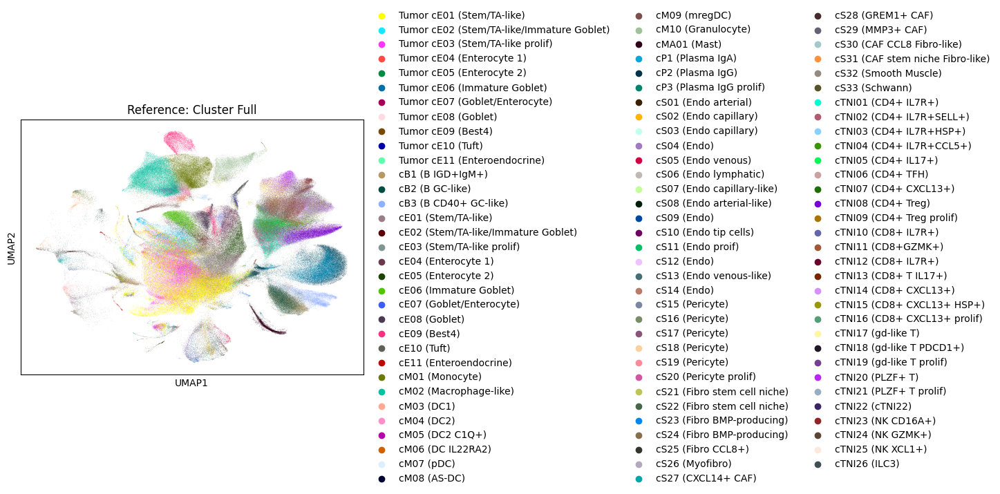

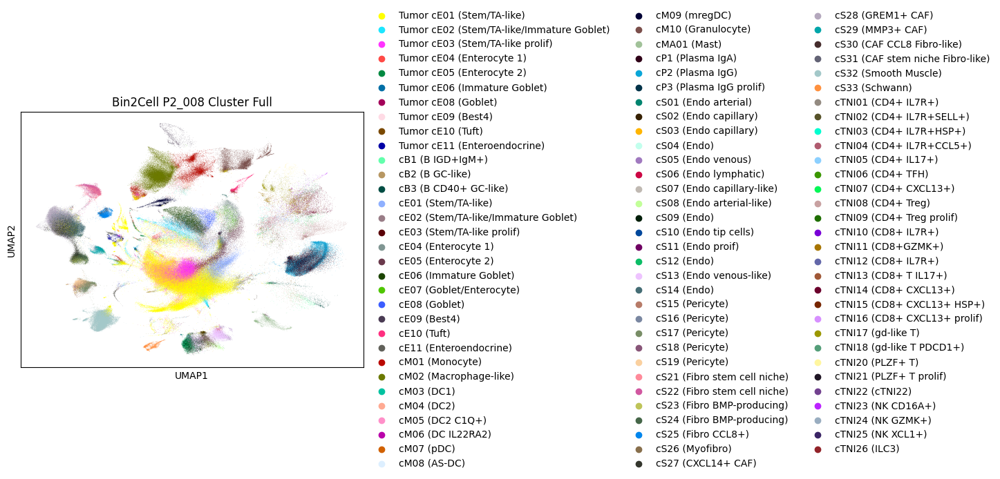

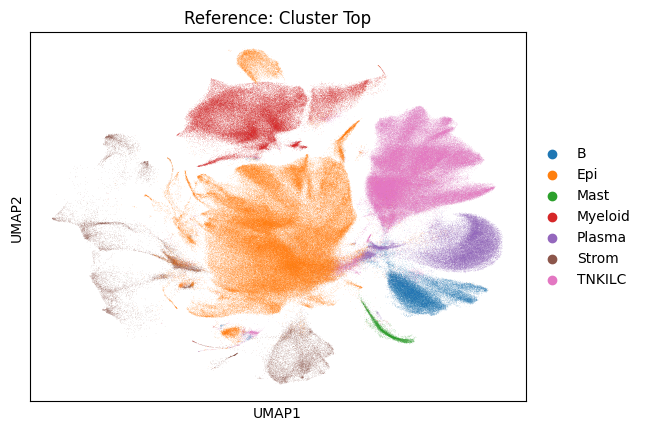

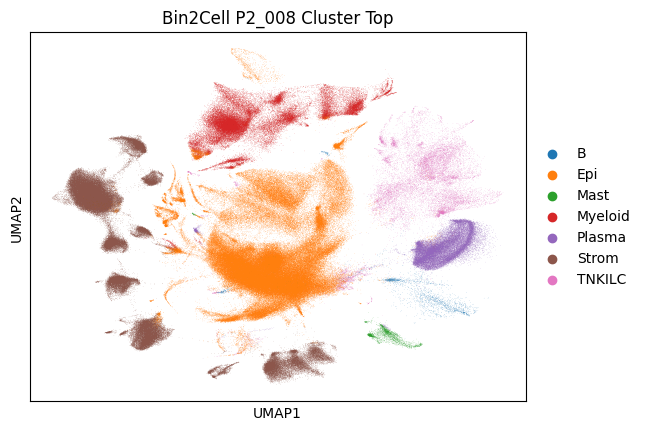

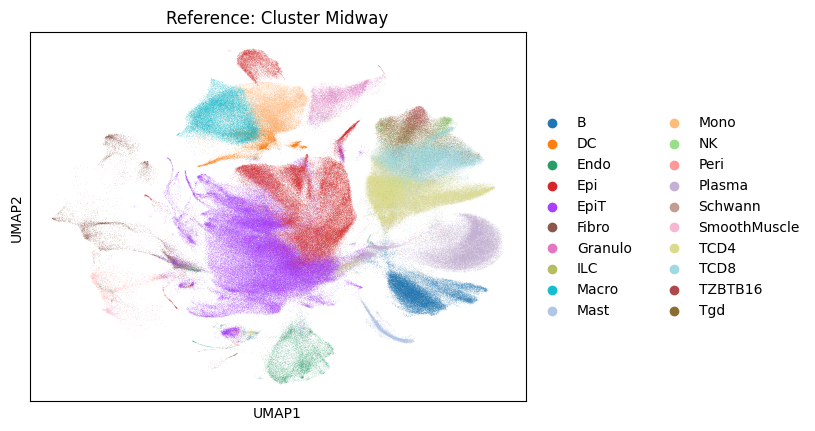

...

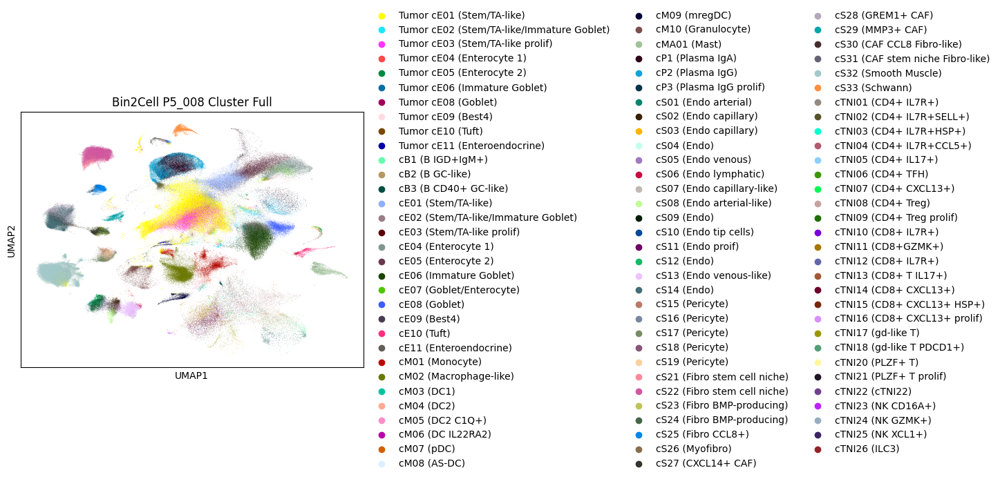

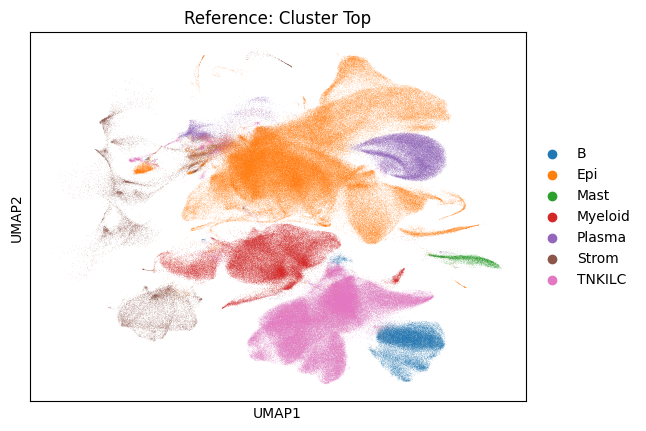

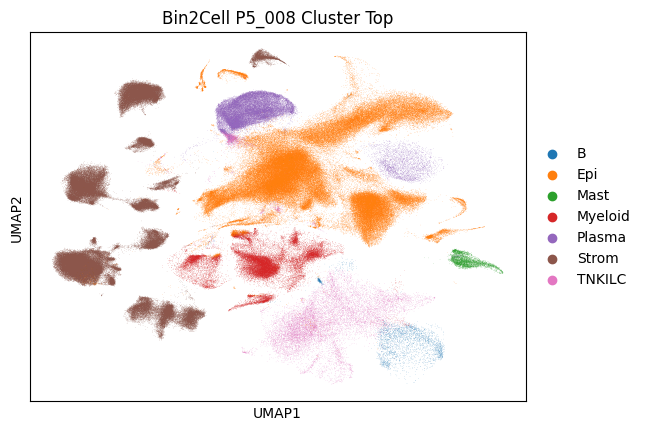

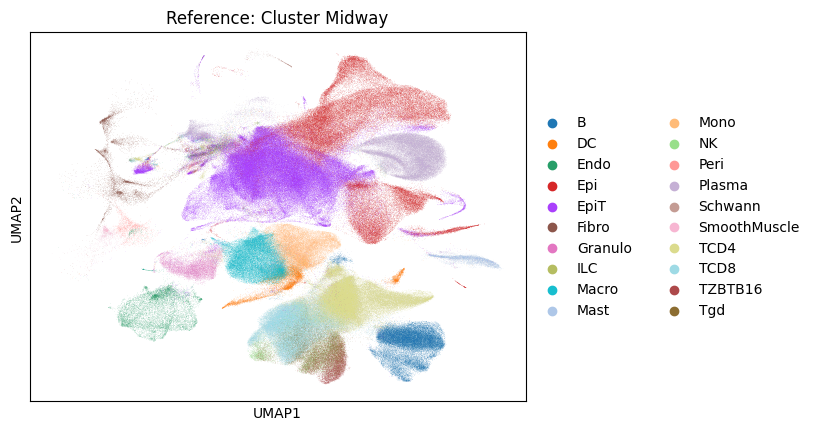

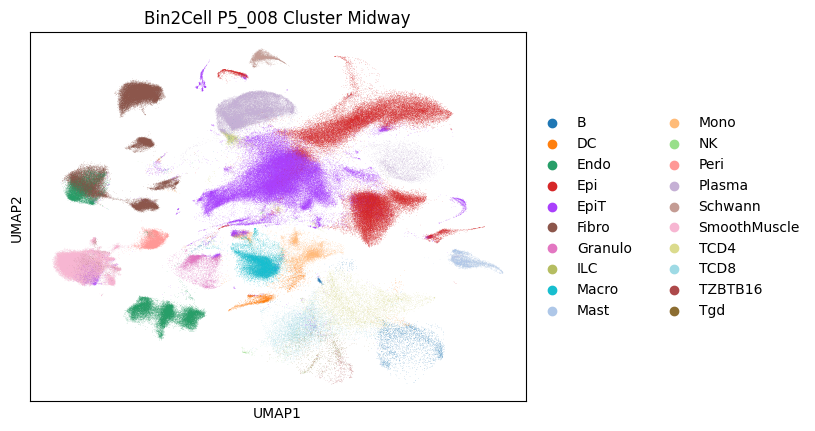

In [38]:
run_label_transfer_and_plot(sc_adata, p2_008_adata, "P2_008")
run_label_transfer_and_plot(sc_adata, p5_008_adata, "P5_008")

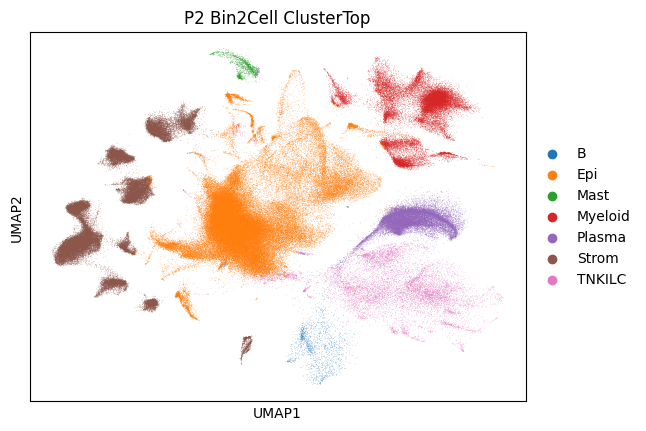

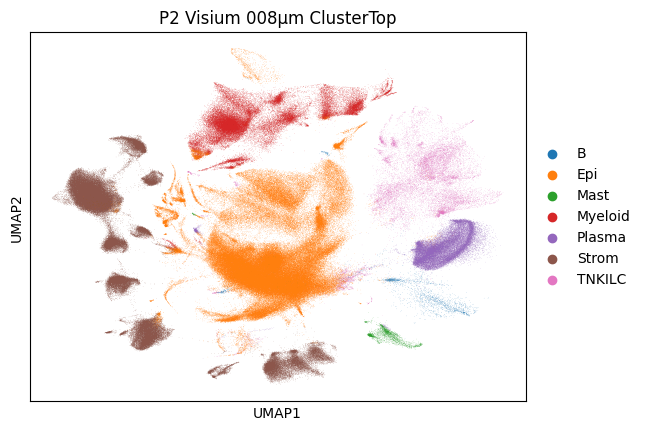

In [13]:
# UMAP for P2 Bin2Cell
fig1 = sc.pl.umap(
    p2_b2c,
    color="predicted_ClusterTop",
    title="P2 Bin2Cell ClusterTop",
    show=False,
    return_fig=True
)
fig1.savefig("/gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P2/umap_cluster_top.png", dpi=400)

# UMAP for P2 Visium 008µm
fig2 = sc.pl.umap(
    p2_008,
    color="predicted_ClusterTop",
    title="P2 Visium 008µm ClusterTop",
    show=False,
    return_fig=True
)
fig2.savefig("/gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P2_008/umap_cluster_top.png", dpi=400)


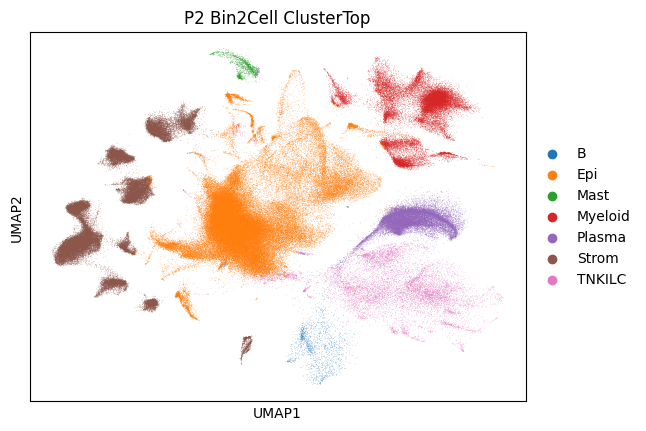

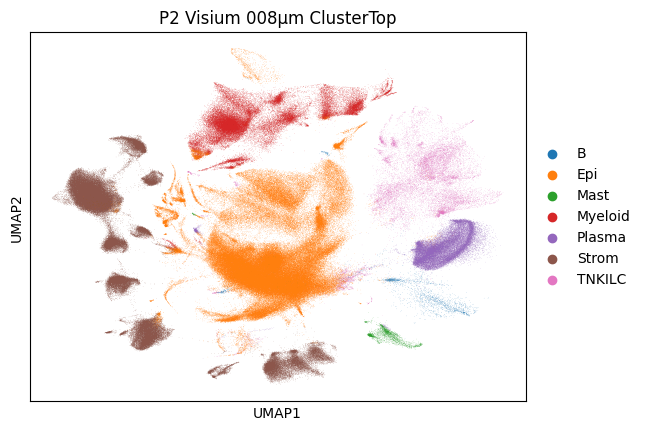

In [8]:
# UMAP of predicted_ClusterTop
sc.pl.umap(p2_b2c, color="predicted_ClusterTop", title="P2 Bin2Cell ClusterTop", show=True)
sc.pl.umap(p2_008, color="predicted_ClusterTop", title="P2 Visium 008µm ClusterTop", show=True)


In [23]:
def plot_spatial_scatter(adata, title, save_path=None, dpi=400):
    import matplotlib.pyplot as plt
    import seaborn as sns

    coords = adata.obsm["spatial"]
    clusters = adata.obs["predicted_ClusterTop"]

    plt.figure(figsize=(8, 6))
    ax = sns.scatterplot(
        x=coords[:, 0],
        y=coords[:, 1],
        hue=clusters,
        s=10,
        palette="tab10",
    )

    ax.invert_yaxis()
    sns.despine(ax=ax, trim=True)
    ax.set_aspect('equal', adjustable='datalim')

    ax.legend(
        title="Cluster",
        loc='center left',
        bbox_to_anchor=(1.0, 0.5),
        borderaxespad=0.0,
        frameon=False,
        fontsize=13,          # Item labels
        markerscale=2.0,      # Marker/dot size


    )

    ax.set_title(title, pad=15)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=dpi)
        print(f"Saved spatial plot to: {save_path}")

    plt.show()


Saved spatial plot to: /gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P2/spatial_cluster_top.png


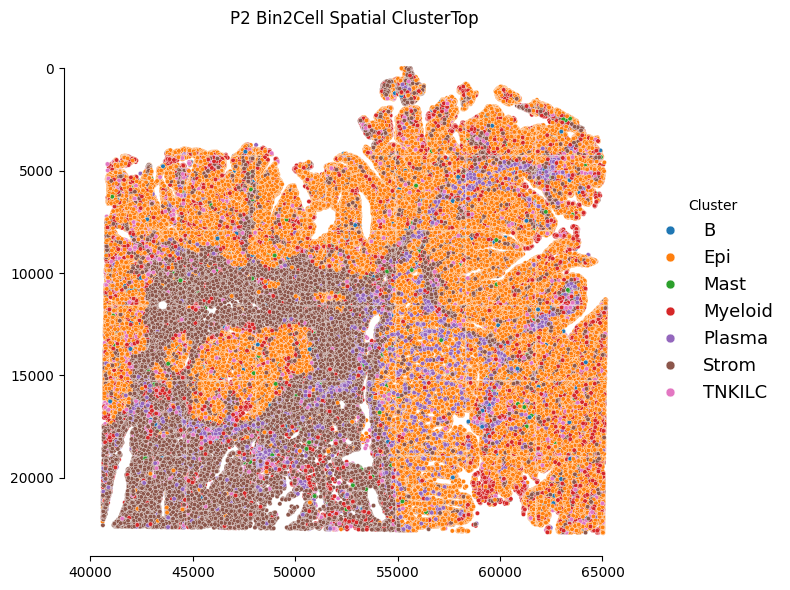

Saved spatial plot to: /gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P2_008/spatial_cluster_top.png


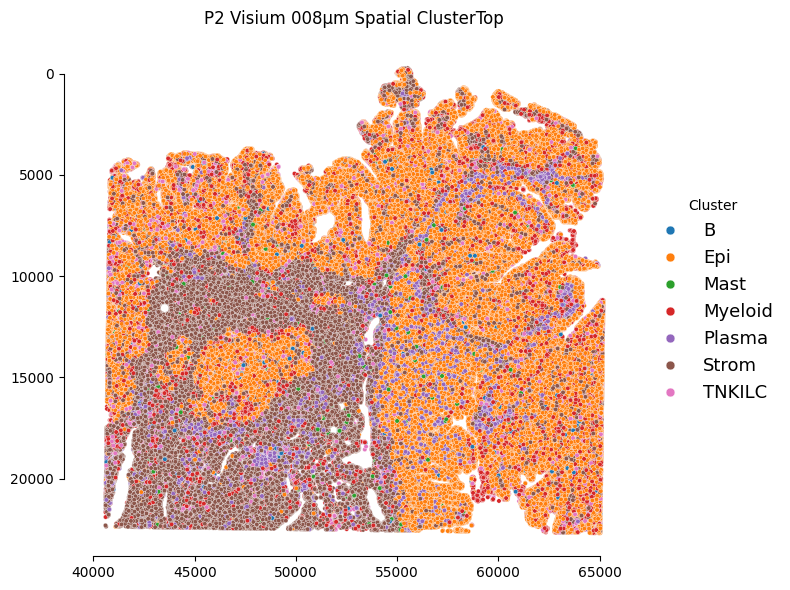

In [24]:
# Save spatial plot for P2 Bin2Cell
plot_spatial_scatter(
    p2_b2c,
    "P2 Bin2Cell Spatial ClusterTop",
    save_path="/gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P2/spatial_cluster_top.png"
)

# Save spatial plot for P2 008µm
plot_spatial_scatter(
    p2_008,
    "P2 Visium 008µm Spatial ClusterTop",
    save_path="/gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P2_008/spatial_cluster_top.png"
)

In [85]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# === Load P2 Bin2Cell Annotated Data ===
p2_b2c = sc.read_h5ad("/gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P2/annotated_P2.h5ad")
p5_b2c = sc.read_h5ad("/gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P5/annotated_P5.h5ad")

p2_008 = sc.read_h5ad("/gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P2_008/annotated_P2_008.h5ad")
p5_008 = sc.read_h5ad("/gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P5_008/annotated_P5_008.h5ad")

print("Loaded:", p2_b2c)

# === Load P2 008µm Visium HD Annotated Data ===
print("Loaded:", p2_008)


Loaded: AnnData object with n_obs × n_vars = 236906 × 611
    obs: 'biosample_id', 'donor_id', 'SpecimenType', 'TissueSource', 'ProcessingMethod', 'PatientTypeID', 'sex', 'Site', 'Grade', 'TumorStage', 'LymphNodeStatus', 'MMRStatusTumor', 'MMRMLH1Tumor', 'qc_geneCount', 'qc_logMappedReads', 'qc_meanReadsPerUmi', 'qc_totalReads', 'qc_logUmiCount', 'qc_bcSwapFraction', 'qc_geneSatFraction', 'qc_seqDupEst', 'qc_umiSatFraction', 'qc_emptyDropPval', 'qc_mitoFraction', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'total_counts', 'log1p_total_counts', 'Sample ID', 'PhenoGraph_clusters', 'Patient', 'Primary Site', 'Sample Type', 'Treatment', 'Cell Compartment', 'PhenoGraph Classification', 'Cell State', 'P(ISC)', 'P(Squamous)', 'P(Fetal)', 'P(Absorptive)', 'P(Proliferative)', 'P(Neuroendocrine)', 'P(Secretory)', 'organoid', 'condition', 'Module Osteob

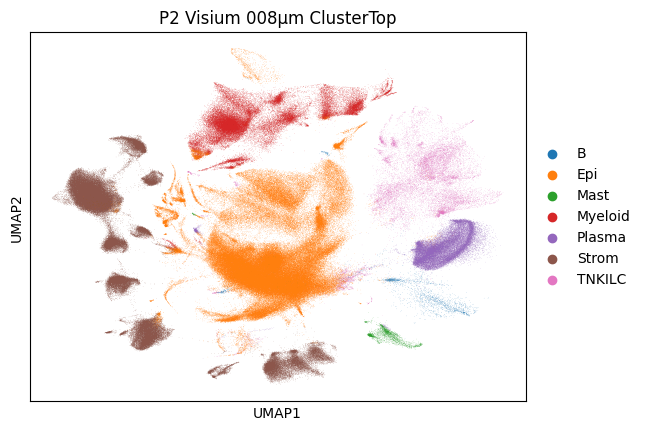

In [11]:
# Generate the UMAP figure (legend-safe)
fig = sc.pl.umap(
    p2_008,
    color="predicted_ClusterTop",
    title="P2 Visium 008µm ClusterTop",
    show=False,
    return_fig=True
)

# Save the figure to your desired location
fig.savefig(
    "/gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P2_008/umap_P2_008_ClusterTop_fixed.png",
    dpi=400,
    bbox_inches="tight",
    pad_inches=0.2
)


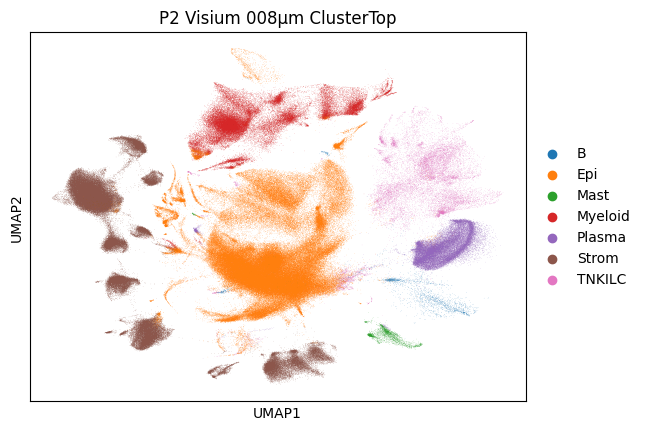

In [12]:
# Generate the UMAP figure (legend-safe)
fig = sc.pl.umap(
    p2_008,
    color="predicted_ClusterTop",
    title="P2 Visium 008µm ClusterTop",
    show=False,
    return_fig=True
)

# Base path to save
base_path = "/gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/figures_P2_008/umap_P2_008_ClusterTop_fixed"

# Save in high-res PNG
fig.savefig(f"{base_path}.png", dpi=400, bbox_inches="tight", pad_inches=0.2)


In [14]:
# Count frequency of predicted full clusters
cluster_counts = p2_b2c.obs["predicted_ClusterFull"].value_counts()

print("Most Common Clusters:\n", cluster_counts.head())
print("\Least Common Clusters:\n", cluster_counts.tail())


Most Common Clusters:
 predicted_ClusterFull
Tumor cE01 (Stem/TA-like)           63170
Tumor cE03 (Stem/TA-like prolif)    20054
cM02 (Macrophage-like)              14581
cP1 (Plasma IgA)                    11065
cP2 (Plasma IgG)                    10620
Name: count, dtype: int64
\Least Common Clusters:
 predicted_ClusterFull
cTNI21 (PLZF+ T prolif)    9
cTNI26 (ILC3)              8
cTNI25 (NK XCL1+)          7
cS11 (Endo proif)          6
Tumor cE09 (Best4)         1
Name: count, dtype: int64


In [24]:
#Clean up the label series
cluster_series = p2_b2c.obs["predicted_ClusterFull"]

# Drop NaNs and empty strings
cluster_series = cluster_series.dropna()
cluster_series = cluster_series[cluster_series.str.strip() != ""]

#  Count and filter
cluster_counts = cluster_series.value_counts()
cluster_counts = cluster_counts[cluster_counts > 0]  # Remove any leftover zeros

# Sort for plotting
cluster_counts_sorted = cluster_counts.sort_values(ascending=False)

# View top and bottom
top10 = cluster_counts_sorted.head(10)
bottom10 = cluster_counts_sorted.tail(10)


/tmp/ipykernel_2858479/3165743818.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


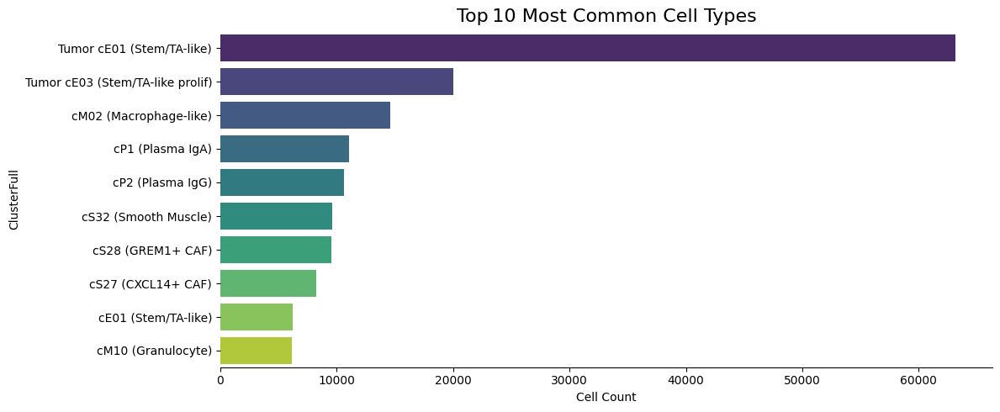

/tmp/ipykernel_2858479/3165743818.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


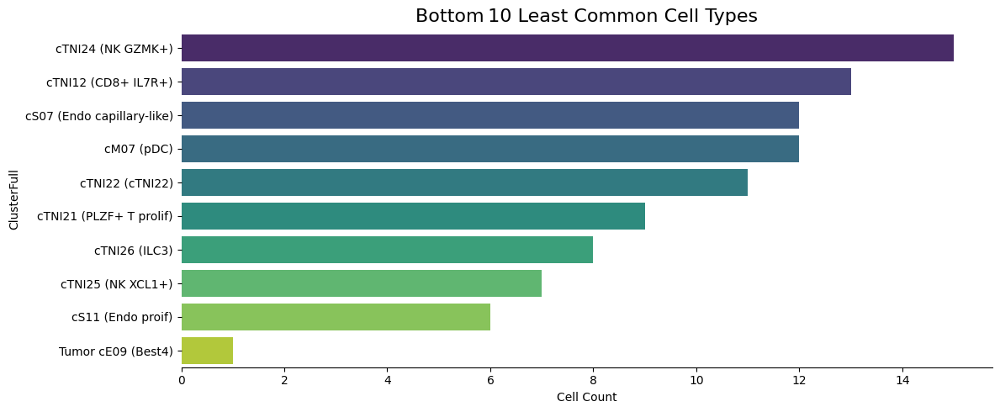

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import shorten

counts = (
    p2_b2c.obs["predicted_ClusterFull"]
    .dropna()                                 # drop NaNs
    .astype(str).str.strip()                  # strip spaces
    .loc[lambda s: s != ""]                   # drop empties
    .value_counts()
)

# choose clusters with non‑zero counts only
counts = counts[counts > 0].sort_values(ascending=False)

top10    = counts.head(10)
bottom10 = counts.tail(10)

# shorten long labels to ≤ 40 chars, keep uniqueness
short = lambda s: shorten(s, width=40, placeholder="…")

def barplot_counts(data, title, outfile):
    plt.figure(figsize=(12, 5))               # wide & short
    ax = sns.barplot(
        x=data.values,
        y=[short(lbl) for lbl in data.index],
        palette="viridis"
    )
    ax.set_title(title, fontsize=16, pad=8)
    ax.set_xlabel("Cell Count")
    ax.set_ylabel("ClusterFull")
    sns.despine(left=True)
    plt.tight_layout()

    # save high‑res
    plt.savefig(f"{outfile}.png", dpi=400, bbox_inches="tight")
    plt.savefig(f"{outfile}.pdf",              bbox_inches="tight")
    plt.show()

barplot_counts(top10,    "Top 10 Most Common Cell Types",   "top10_clusterfull")
barplot_counts(bottom10, "Bottom 10 Least Common Cell Types", "bottom10_clusterfull")


/tmp/ipykernel_2858479/3792320385.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


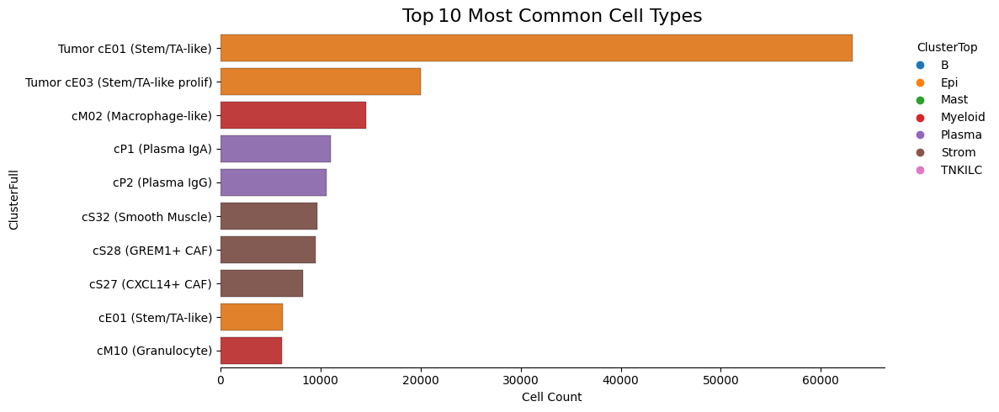

/tmp/ipykernel_2858479/3792320385.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


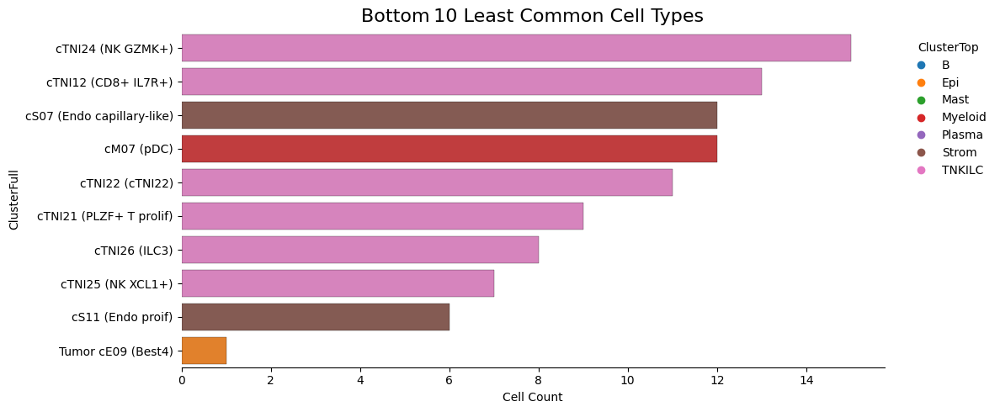

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import shorten

counts = (
    p2_b2c.obs["predicted_ClusterFull"]
        .dropna()
        .astype(str).str.strip()
        .loc[lambda s: s != ""]
        .value_counts()
)

counts = counts[counts > 0].sort_values(ascending=False)
top10    = counts.head(10)
bottom10 = counts.tail(10)

full2top = (
    p2_b2c.obs[["predicted_ClusterFull", "predicted_ClusterTop"]]
        .dropna()
        .set_index("predicted_ClusterFull")["predicted_ClusterTop"]
        .to_dict()
)

top_categories = ["B", "Epi", "Mast", "Myeloid", "Plasma", "Strom", "TNKILC"]
palette = dict(zip(top_categories, sns.color_palette("tab10", n_colors=len(top_categories))))

# helper
short = lambda s: shorten(s, width=40, placeholder="…")

def barplot_counts_coloured(data, title, outfile):
    # derive colour list for bars
    colours = [palette[full2top[lbl]] for lbl in data.index]

    plt.figure(figsize=(12, 5))
    sns.barplot(
        x=data.values,
        y=[short(lbl) for lbl in data.index],
        palette=colours,
        edgecolor="black", linewidth=0.2
    )
    plt.title(title, fontsize=16, pad=8)
    plt.xlabel("Cell Count")
    plt.ylabel("ClusterFull")
    sns.despine(left=True)

    # legend with 7 items
    handles = [plt.Line2D([0], [0], marker='o', linestyle='',
                          color=palette[c], label=c) for c in top_categories]
    plt.legend(title="ClusterTop", handles=handles,
               bbox_to_anchor=(1.02, 1), loc="upper left", frameon=False)

    plt.tight_layout()
    plt.savefig(f"{outfile}.png", dpi=400, bbox_inches="tight")
    plt.savefig(f"{outfile}.pdf",              bbox_inches="tight")
    plt.show()

# ── Plot & save ────────────────────────────────────────────────────────────
barplot_counts_coloured(top10,    "Top 10 Most Common Cell Types",    "top10_clusterfull")
barplot_counts_coloured(bottom10, "Bottom 10 Least Common Cell Types", "bottom10_clusterfull")


In [40]:
# Immune macro‑groups in your taxonomy
immune_tops = ["B", "Plasma", "Mast", "Myeloid", "TNKILC"]   # adjust if needed

immune_df = (
    p2_b2c.obs[["predicted_ClusterFull", "predicted_ClusterTop"]]
        .dropna()
        .rename(columns={"predicted_ClusterFull": "Full",
                         "predicted_ClusterTop" : "Top"})
        .query("Top in @immune_tops")
)

# counts by Full
imm_counts = immune_df["Full"].value_counts().sort_values(ascending=False)


In [42]:
total_cells   = len(p2_b2c)
immune_cells  = len(immune_df)
nonimmune_pct = 100 * (total_cells - immune_cells) / total_cells
immune_pct    = 100 * immune_cells / total_cells
print(f"Immune: {immune_pct:.1f}%  •  Non‑immune: {nonimmune_pct:.1f}%")


Immune: 27.9%  •  Non‑immune: 72.1%


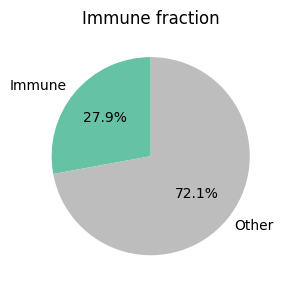

In [43]:
plt.figure(figsize=(3,3))
plt.pie([immune_cells, total_cells-immune_cells],
        labels=["Immune","Other"], autopct="%.1f%%",
        colors=["#66c2a5","#bdbdbd"], startangle=90)
plt.title("Immune fraction")
plt.tight_layout(); plt.show()


/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/gpfs/commons/groups/innovation/jjos

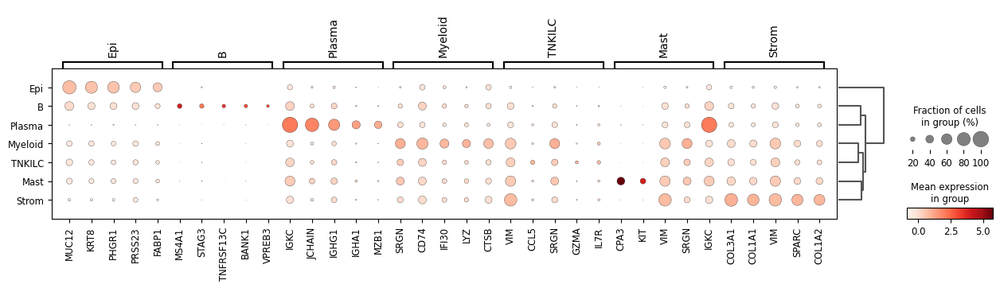

In [53]:
import scanpy as sc

# 1. differential expression
sc.tl.rank_genes_groups(
    p2_b2c,
    groupby="predicted_ClusterTop",
    method="wilcoxon",
    n_genes=50
)

# 2. dot‑plot of top 5 genes per ClusterTop
sc.pl.rank_genes_groups_dotplot(
    p2_b2c,
    n_genes=5,
    show=True,
    use_raw=False,
    save="_ClusterTop_dotplot.png"   # saved to ./figures/ by Scanpy
)


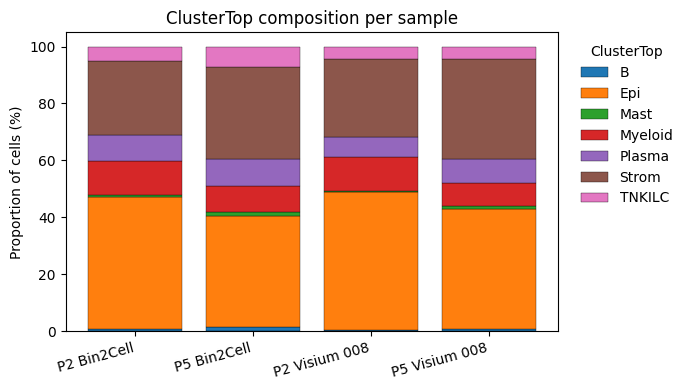

In [67]:
import pandas as pd, matplotlib.pyplot as plt, seaborn as sns

samples = {
    "P2 Bin2Cell": p2_b2c,
    "P5 Bin2Cell": p5_b2c,
    "P2 Visium 008": p2_008,
    "P5 Visium 008": p5_008,
}

tbl = (
    pd.concat(
        [
            ad.obs["predicted_ClusterTop"]
              .value_counts()
              .rename(sample)
              for sample, ad in samples.items()
        ],
        axis=1
    )
    .fillna(0)
    .T                                    # rows = sample, cols = ClusterTop
)

# convert to %
tbl_pct = tbl.div(tbl.sum(axis=1), axis=0) * 100

cluster_order  = ["B", "Epi", "Mast", "Myeloid", "Plasma", "Strom", "TNKILC"]
palette        = dict(zip(
    cluster_order,
    sns.color_palette("tab10", n_colors=len(cluster_order)),
))

plt.figure(figsize=(7,4))
bottom = pd.Series(0, index=tbl_pct.index)

for ct in cluster_order:
    plt.bar(
        x=tbl_pct.index,
        height=tbl_pct[ct],
        bottom=bottom,
        color=palette[ct],
        label=ct,
        edgecolor="black", linewidth=0.25
    )
    bottom += tbl_pct[ct]

plt.ylabel("Proportion of cells (%)")
plt.title("ClusterTop composition per sample")
plt.xticks(rotation=15, ha="right")
plt.legend(title="ClusterTop", bbox_to_anchor=(1.02,1),
           loc="upper left", frameon=False)
plt.tight_layout()
plt.savefig("composition_per_sample.png", dpi=400, bbox_inches="tight")
plt.savefig("composition_per_sample.pdf",              bbox_inches="tight")
plt.show()


/tmp/ipykernel_2858479/2716928940.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(tbl_pct.index, rotation=15, ha="right")


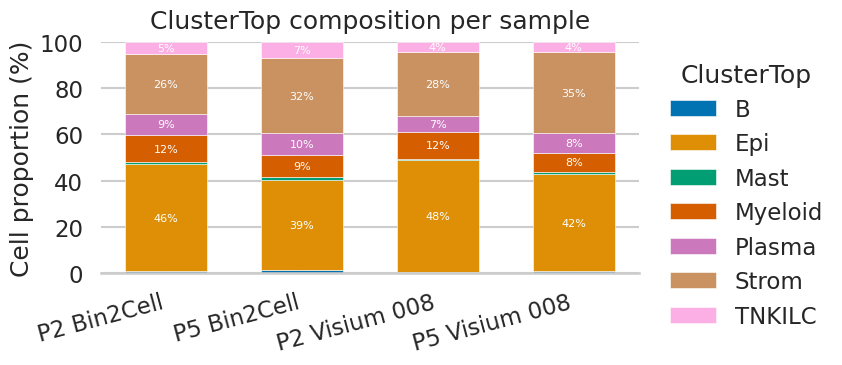

In [74]:
sns.set_theme(style="whitegrid", context="talk")   # ← nicer defaults


/tmp/ipykernel_2858479/1031514253.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


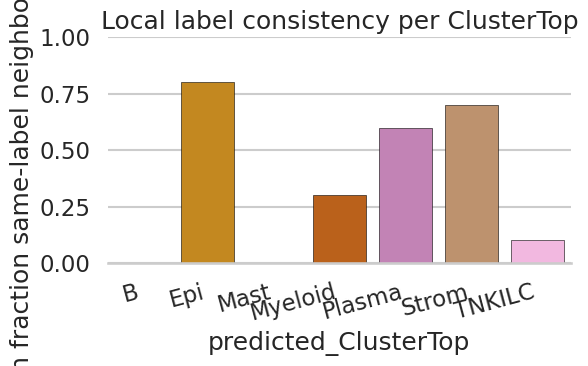

In [81]:
from sklearn.neighbors import NearestNeighbors
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns

# ── compute kNN purity per cell (same logic) ───────────────────────────────
coords  = p2_b2c.obsm["spatial"]
labels  = p2_b2c.obs["predicted_ClusterTop"].to_numpy()   # 7 categories
nbrs    = NearestNeighbors(n_neighbors=11).fit(coords)
idx     = nbrs.kneighbors(return_distance=False)

p2_b2c.obs["knn_purity_top"] = [
    (labels[neigh[1:]] == labels[i]).mean() for i, neigh in enumerate(idx)
]

# ── summarise median purity per ClusterTop ─────────────────────────────────
purity_top = (
    p2_b2c.obs.groupby("predicted_ClusterTop", observed=True)["knn_purity_top"]
      .median()
      .loc[["B","Epi","Mast","Myeloid","Plasma","Strom","TNKILC"]]  # fixed order
)

# ── bar plot ───────────────────────────────────────────────────────────────
sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(6,4))
sns.barplot(
    x=purity_top.index,
    y=purity_top.values,
    palette=sns.color_palette("colorblind", 7),
    edgecolor="black", linewidth=0.4
)
plt.ylim(0,1)
plt.ylabel("Median fraction same‑label neighbours (k = 10)")
plt.title("Local label consistency per ClusterTop")
plt.xticks(rotation=15, ha="right")
sns.despine(left=True)
plt.tight_layout()
plt.savefig("knn_purity_clusterTop.png", dpi=400, bbox_inches="tight")
plt.savefig("knn_purity_clusterTop.pdf",              bbox_inches="tight")
plt.show()


/tmp/ipykernel_2858479/3737972267.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(


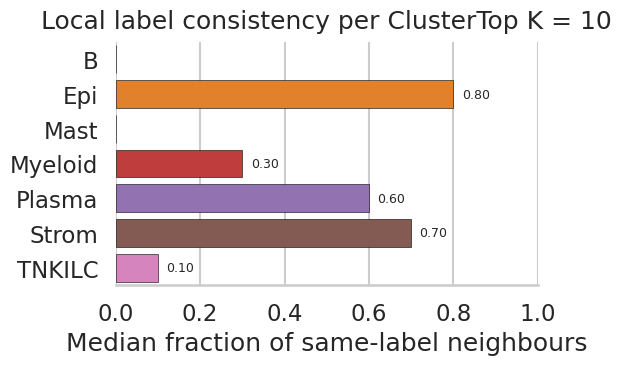

In [83]:
import pandas as pd, seaborn as sns, matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
import numpy as np

#Compute k‑nearest‑neighbour purity per cell (k=10)
coords  = p2_b2c.obsm["spatial"]
labels  = p2_b2c.obs["predicted_ClusterTop"].to_numpy()      # 7 macro labels
idx     = NearestNeighbors(n_neighbors=11).fit(coords).kneighbors(return_distance=False)

p2_b2c.obs["knn_purity_top"] = [
    (labels[n[1:]] == labels[i]).mean() for i, n in enumerate(idx)
]

# Median purity per ClusterTop 
purity_top = (
    p2_b2c.obs.groupby("predicted_ClusterTop", observed=True)["knn_purity_top"]
      .median()
      .reindex(["B", "Epi", "Mast", "Myeloid", "Plasma", "Strom", "TNKILC"])
)

# Consistent colour palette
palette = {
    "B":       "#1f77b4",  # blue 
    "Epi":     "#ff7f0e",  # orange
    "Mast":    "#2ca02c",  # green
    "Myeloid": "#d62728",  # red
    "Plasma":  "#9467bd",  # purple
    "Strom":   "#8c564b",  # brown
    "TNKILC":  "#e377c2",  # pink
}

sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(6, 4))

bars = sns.barplot(
    x=purity_top.values,
    y=purity_top.index,
    palette=[palette[c] for c in purity_top.index],
    edgecolor="black", linewidth=0.4
)

for p in bars.patches:
    width = p.get_width()
    if width > 0.05:                        
        bars.text(width + 0.02,             
                  p.get_y() + p.get_height() / 2,
                  f"{width:.2f}",
                  va="center", ha="left", fontsize=9)

plt.xlim(0, 1)
plt.xlabel("Median fraction of same‑label neighbours")
plt.ylabel("")
plt.title("Local label consistency per ClusterTop K = 10", pad=10)
sns.despine(left=True)
plt.tight_layout()

plt.savefig("clusterTop_knn_purity.png", dpi=400, bbox_inches="tight")
plt.savefig("clusterTop_knn_purity.pdf",              bbox_inches="tight")
plt.show()


/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/gpfs/commons/groups/innovation/jjoseph/enact_results/integrate_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/gpfs/commons/groups/innovation/jjos

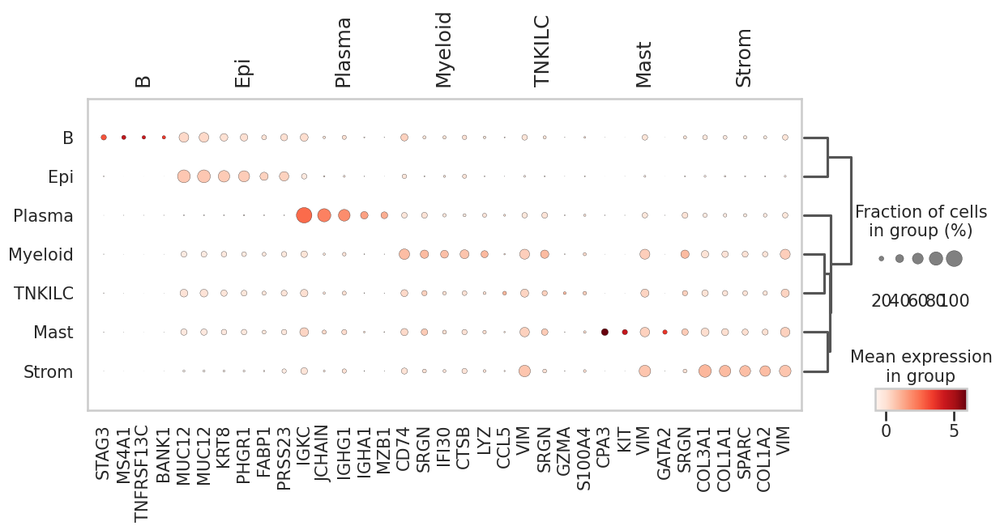

In [95]:
import scanpy as sc

# 1. differential expression (use e.g. t‑test or Wilcoxon)
sc.tl.rank_genes_groups(
    p2_008,
    groupby="predicted_ClusterTop",
    method="wilcoxon",
    n_genes=50
)

# 2. dot‑plot of top 5 genes per ClusterTop
sc.pl.rank_genes_groups_dotplot(
    p2_008,
    n_genes=5,
    show=True,
    use_raw=False,
    save="_ClusterTop_dotplot.png", 
    figsize=(14, 5)# saved to ./figures/ by Scanpy
)
